# MD004 ENTREGA6 ANÁLISIS DE COMPONENTES PRINCIPALES

**Descripción de la tarea:**

El fichero 20230119_DatosBoston incluye datos de precios del mercado de viviendas de Boston (median_value), así como datos adicionales sobre la ubicación de la vivienda y otros datos sociodemográficos. La descripción de las columnas del dataset es la que sigue:

- **crime_index**: Índice de criminalidad de la zona
- **urban_ratio**: Ratio de zona urbana residencial sobre el total
- **industry_ratio**: Ratio de industria de la zona
- **c_river_variable**: 1 si la zona colinda con un río y 0 si no
- **nox_concentration**: Concentración de óxido nitroso en la zona
- **rooms_per_dwelling**: Número de habitaciones medio por vivienda
- **dwelling_age**: “Edad” media de la vivienda
- **dwelling_dist**: Distancia media ponderada con los centros urbanos de la ciudad
- **highway_index**: Índice de accesibilidad sobre autopistas cercanas
- **tax_ratio**: Índice de tasas por cada 10000usd
- **teacher_ratio**: Ratio de alumno por profesor
- **racial_index**: Índice de proporción de población no caucásica
- **lower_status**: Porcentaje de población de “clase-baja”
- **median_value**: Valor medio de precio de la vivienda (En 1000USD)

**Se pide:**

1. **Visualización y familiarización del dataset (2p)**: Se valorará el uso de las técnicas empleadas, así como la explicación de las visualizaciones / estadísticos utilizados en clases anteriores.
2. **Análisis de correlación y de componentes principales (3p)**: Se valorará principalmente la interpretación de dichos análisis así como la “limpieza” de la presentación
3. **Análisis de ANOVA (2p)**: Se valorará principalmente la interpretación del análisis, así como la limpieza de los datos
4. **Desarrollo y justificación de las variables (1p)**: En base a las conclusiones sacadas en los puntos 1, 2, y 3 ¿Qué variables debemos utilizar en nuestro modelo de regresión lineal?
5. **Estudio de regresión lineal del median_value (2p)**: ¿Qué resultados obtenemos en el modelo?,  ¿Predice correctamente?, ¿Utilizarías este modelo en la vida real?  

### Carga de librerias y lectura de datos

In [5]:
library(tidyverse)
library(ggplot2)
install.packages('GGally', dependencies=TRUE, repos="https://CRAN.R-project.org/")
library(GGally)
library(gridExtra)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.3     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.4     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.0
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
Warning message:
“unable to access index for repository https://CRAN.R-project.org/src/contrib:
  cannot open URL 'https://CRAN.R-project.org/src/contrib/PACKAGES'”
Warning message:
“package ‘GGally’ is not available for this version of R

A version of this package for your version of R might be available elsewhere,
see the ideas at
https://cran.r-project.org/doc/manuals/r-patched/R-admin.html#Installing-packages”
Registered S3 method overwritten by 'GGally':
  method fro

In [8]:
data <- read.csv(file='20230119_DatosBoston.csv', header=TRUE, sep=';', dec='.')
head(data)

,crime_index,urban_ratio,industry_ratio,c_river_variable,nox_concentration,rooms_per_dwelling,dwelling_age,dwelling_dist,highway_index,tax_ratio,teacher_ratio,racial_index,lower_status,median_value
,<dbl>,<dbl>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<int>,<int>,<dbl>,<dbl>,<dbl>,<dbl>
1,0.00632,18,2.31,0,0.538,6.575,65.2,4.090,1,296,15.3,396.90,4.98,24.0
2,0.02731,0,7.07,0,0.469,6.421,78.9,49.671,2,242,17.8,396.90,9.14,21.6
3,0.02729,0,7.07,0,0.469,7.185,61.1,49.671,2,242,17.8,392.83,4.03,34.7
4,0.03237,0,2.18,0,0.458,6.998,45.8,60.622,3,222,18.7,394.63,2.94,33.4
5,0.06905,0,2.18,0,0.458,7.147,54.2,60.622,3,222,18.7,396.90,5.33,36.2
6,0.02985,0,2.18,0,0.458,6.430,58.7,60.622,3,222,18.7,394.12,5.21,28.7


### Visualización y familiarización del dataset 

In [9]:
str(data)

'data.frame':	506 obs. of  14 variables:
 $ crime_index       : num  0.00632 0.02731 0.02729 0.03237 0.06905 ...
 $ urban_ratio       : num  18 0 0 0 0 0 12.5 12.5 12.5 12.5 ...
 $ industry_ratio    : num  2.31 7.07 7.07 2.18 2.18 2.18 7.87 7.87 7.87 7.87 ...
 $ c_river_variable  : int  0 0 0 0 0 0 0 0 0 0 ...
 $ nox_concentration : num  0.538 0.469 0.469 0.458 0.458 0.458 0.524 0.524 0.524 0.524 ...
 $ rooms_per_dwelling: num  6.58 6.42 7.18 7 7.15 ...
 $ dwelling_age      : num  65.2 78.9 61.1 45.8 54.2 58.7 66.6 96.1 100 85.9 ...
 $ dwelling_dist     : num  4.09 49.67 49.67 60.62 60.62 ...
 $ highway_index     : int  1 2 2 3 3 3 5 5 5 5 ...
 $ tax_ratio         : int  296 242 242 222 222 222 311 311 311 311 ...
 $ teacher_ratio     : num  15.3 17.8 17.8 18.7 18.7 18.7 15.2 15.2 15.2 15.2 ...
 $ racial_index      : num  397 397 393 395 397 ...
 $ lower_status      : num  4.98 9.14 4.03 2.94 5.33 ...
 $ median_value      : num  24 21.6 34.7 33.4 36.2 28.7 22.9 27.1 16.5 18.9 ...


In [3]:
summary(data)

  crime_index        urban_ratio     industry_ratio  c_river_variable 
 Min.   :  0.0063   Min.   :  0.00   Min.   : 0.46   Min.   :0.00000  
 1st Qu.:  0.0820   1st Qu.:  0.00   1st Qu.: 5.19   1st Qu.:0.00000  
 Median :  0.2565   Median :  0.00   Median : 9.69   Median :0.00000  
 Mean   :131.6957   Mean   : 11.36   Mean   :11.14   Mean   :0.06917  
 3rd Qu.:143.3370   3rd Qu.: 12.50   3rd Qu.:18.10   3rd Qu.:0.00000  
 Max.   :996.6540   Max.   :100.00   Max.   :27.74   Max.   :1.00000  
 nox_concentration rooms_per_dwelling  dwelling_age    dwelling_dist    
 Min.   :0.3850    Min.   :3.561      Min.   :  2.90   Min.   :  1.137  
 1st Qu.:0.4490    1st Qu.:5.886      1st Qu.: 45.02   1st Qu.: 17.930  
 Median :0.5380    Median :6.208      Median : 77.50   Median : 27.533  
 Mean   :0.5547    Mean   :6.285      Mean   : 68.57   Mean   : 33.837  
 3rd Qu.:0.6240    3rd Qu.:6.623      3rd Qu.: 94.08   3rd Qu.: 47.648  
 Max.   :0.8710    Max.   :8.780      Max.   :100.00   Max.   :12

Nuestro dataset esta formado por 14 variables distintas, las cuales son todas númericas por lo que no hará falta realizar transformaciones para trabajar con ellas. Como vemos hay unas cuantas continuas y otras con solo números enteros,, pero una de las cosas más importantes a mencionar es el hecho de que solo una de las 14 variables es categórica.

Se puede apreciar tambien otras cosas como que el indice de proporción de población no caucásica es mayormente alto, o que probablemente haya algun outlier en el indice de criminalidad ya que vemos como el valor máximo se desvia muchísimo de la media y el tercer quartil.

Para la visualización de los datos y llegar a un mejor entendimiento de cada variable de forma individual, voy a crear una función que para cada variable haga un plot de un histograma, boxplot y qqplot y realize un test de shapiro para determinar la normalidad.

In [121]:
#install.packages("nortest")
#library(nortest)

showVar <- function(variable, varname) {

    plots = list()
    
    grafico = ggplot(data) +
        aes_string(x = varname) +
        geom_histogram(bins = 8, fill = '#e69138', color = 'white', na.rm = TRUE) +
        theme(text = element_text(size = 15), axis.text.x = element_text(size = 14)) + 
        labs(title = paste('Hist', varname))
    plots[['hist']] = grafico
    
    box_plot = ggplot(data, aes(x = '', y = (variable))) +
        stat_boxplot(geom = 'errorbar', color = '#3c0023', na.rm = TRUE) +
        geom_boxplot(fill = '#e69138', color = '#3c0023', na.rm = TRUE) +
        coord_flip() +
        labs(title = paste('Boxplot', varname), y = varname) +
        theme(panel.background = element_rect(fill = 'lightgray'),
            panel.grid.major = element_line(color = 'white'),
            panel.grid.minor = element_line(color = 'white')) +
        theme(text = element_text(size = 12))
    plots[['box']] = box_plot
    
    qqplot = ggplot(data, aes(sample = (variable))) +
        stat_qq() +
        stat_qq_line(color ='#e69138', lwd = 1) +
        labs(title = paste('qqplot', varname),
             x = 'Theoretical Quantiles',
             y = 'Sample Quantiles') +
        theme(panel.background = element_rect(fill = 'white'),
            panel.grid.major = element_line(color = 'lightgray'),
            panel.grid.minor = element_line(color = 'lightgray')) +
        theme(text = element_text(size = 12))
      plots[["qqplot"]] = qqplot
    
    options(
      repr.plot.width = 15,  
      repr.plot.height = 4 
    )
    grid.arrange(grobs = plots, ncol = 3, widths = rep(2, 3))

    resultado_shapiro <- shapiro.test(variable)
    print(resultado_shapiro)
}


	Shapiro-Wilk normality test

data:  variable
W = 0.60473, p-value < 2.2e-16



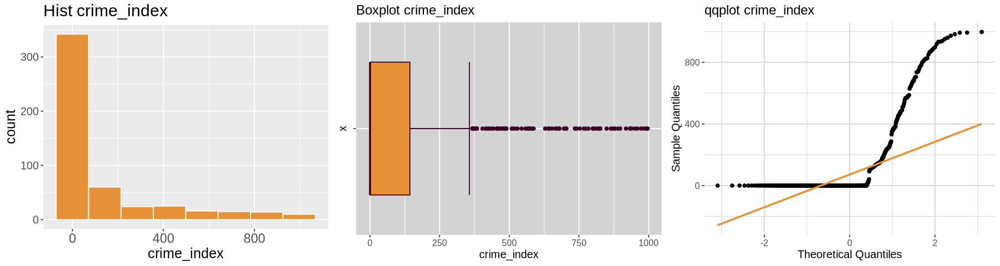

In [122]:
showVar(data$crime_index, "crime_index")

Vemos como a priori esta variable no parece mostrar demasiada información ya que la mayoria de datos parece estar en 0 o números muy bajos y la distribución de los datos es poco útil.


	Shapiro-Wilk normality test

data:  variable
W = 0.55595, p-value < 2.2e-16



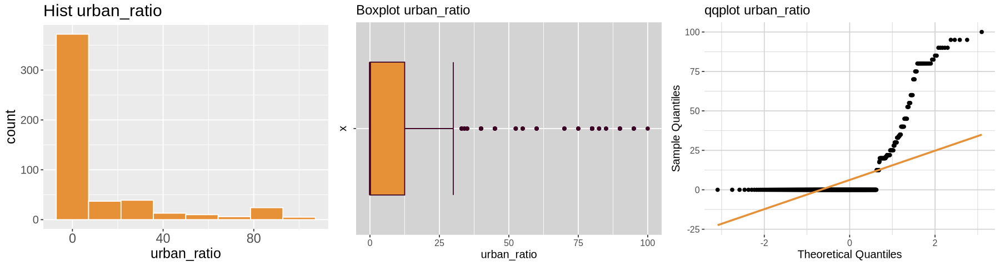

In [123]:
showVar(data$urban_ratio, "urban_ratio")

Al igual que antes vemos como a priori esta variable no parece mostrar demasiada información ya que la mayoria de datos parece estar en 0 o números muy bajos y la distribución de los datos es poco útil.


	Shapiro-Wilk normality test

data:  variable
W = 0.89979, p-value < 2.2e-16



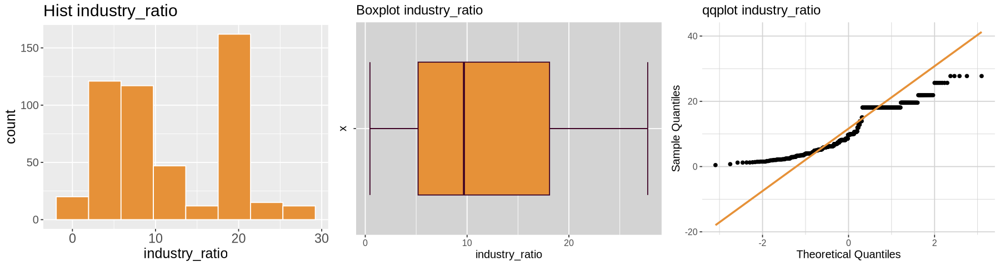

In [124]:
showVar(data$industry_ratio, "industry_ratio")

Esta variable parece seguir una variable con una distribución y desviación mas estándares sobretodo por lo que apreciamos en el boxplot, y pese a no seguir una normal esta variable podría ser-nos útil teniendo en cuenta que tendría bastante sentido que el ratio de industria de la zona influya en el precio medio de la vivienda.


	Shapiro-Wilk normality test

data:  variable
W = 0.27476, p-value < 2.2e-16



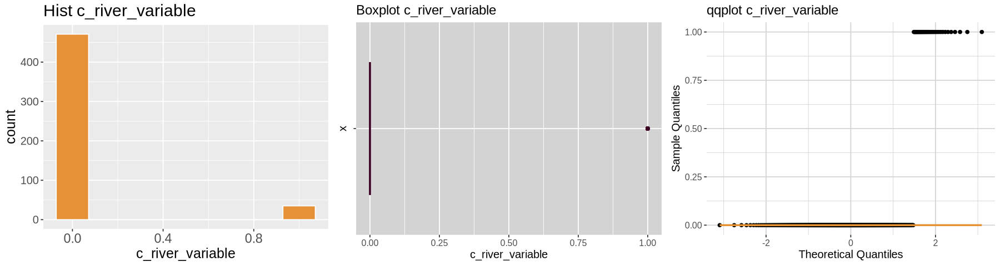

In [125]:
showVar(data$c_river_variable, "c_river_variable")

Al ser una variable categorica estos gráficos no aportan demasiada información a excepción de que podemos ver que la mayoria de las viviendas no son colindantes a un rio.


	Shapiro-Wilk normality test

data:  variable
W = 0.93564, p-value = 5.776e-14



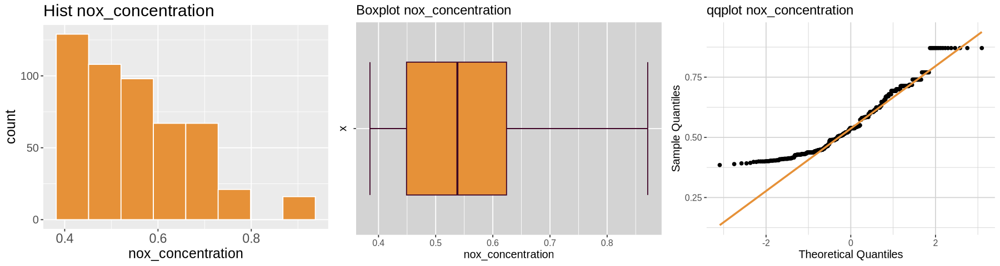

In [126]:
showVar(data$nox_concentration, "nox_concentration")

Esta variable parece seguir una distribución bastante lineal donde a mayor concentracion menos viviendas hay. Habrá que esperar al análisis de correlaciones para saber que tan útil puede resultarnos


	Shapiro-Wilk normality test

data:  variable
W = 0.96087, p-value = 2.412e-10



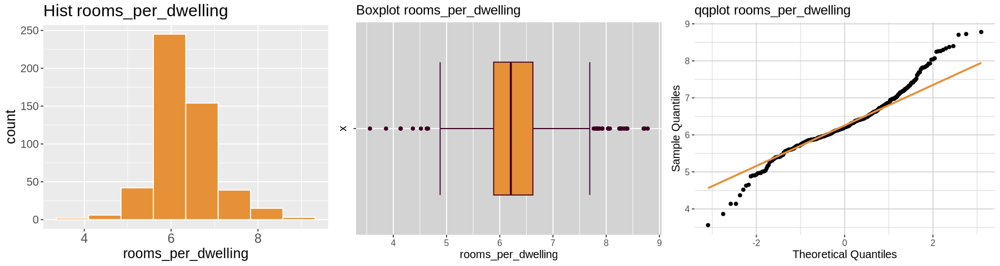

In [127]:
showVar(data$rooms_per_dwelling, "rooms_per_dwelling")

De todas las variables observadas esta es la única que se acerca realmente a una distribución normal, aunque tal y como vemos con el boxplot parece tener unos cuantos puntos que podrian llegar a ser considerados outliers.


	Shapiro-Wilk normality test

data:  variable
W = 0.89201, p-value < 2.2e-16



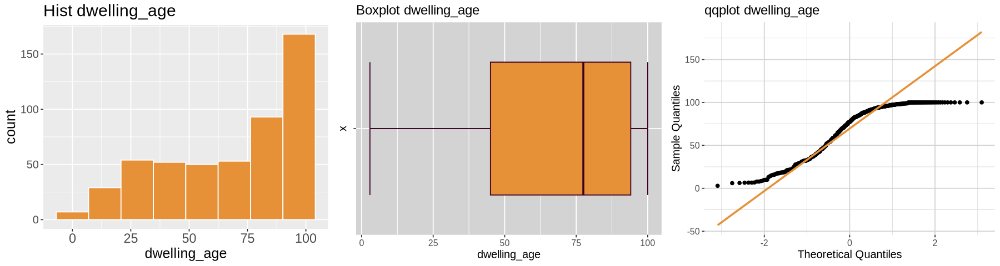

In [128]:
showVar(data$dwelling_age, "dwelling_age")

A través del qqplot observamos como parece seguir una distribucion parecida a una normal hasta cierto punto donde el valor se vuelve homogeneo.


	Shapiro-Wilk normality test

data:  variable
W = 0.93351, p-value = 3.19e-14



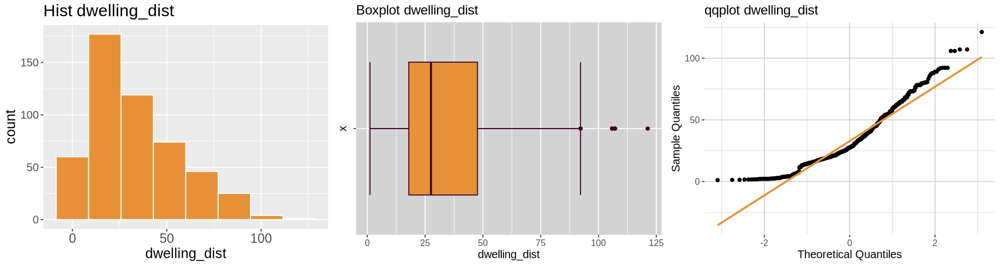

In [129]:
showVar(data$dwelling_dist, "dwelling_dist")

Representando la distancia al centro de la ciudad, esta variable tendria sentido que influyera en el precio de la vivienda y como vemos en su distribución, pese a no seguir una normal, se le parece bastante.


	Shapiro-Wilk normality test

data:  variable
W = 0.67964, p-value < 2.2e-16



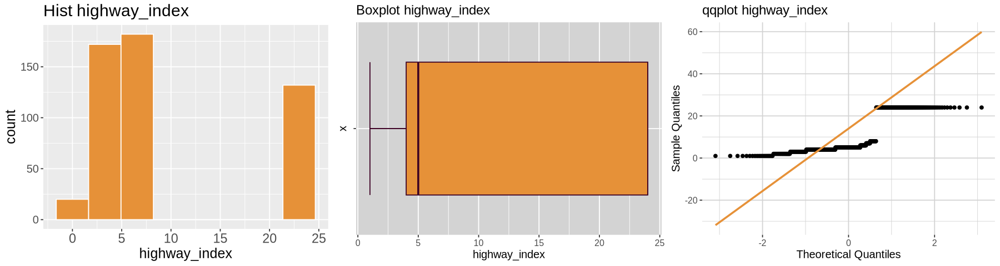

In [130]:
showVar(data$highway_index, "highway_index")

Poco a comentar de esta variable, a priori parece que deberia afectar al precio sin embargo observamos distribuciones mas bien confusas.


	Shapiro-Wilk normality test

data:  variable
W = 0.81524, p-value < 2.2e-16



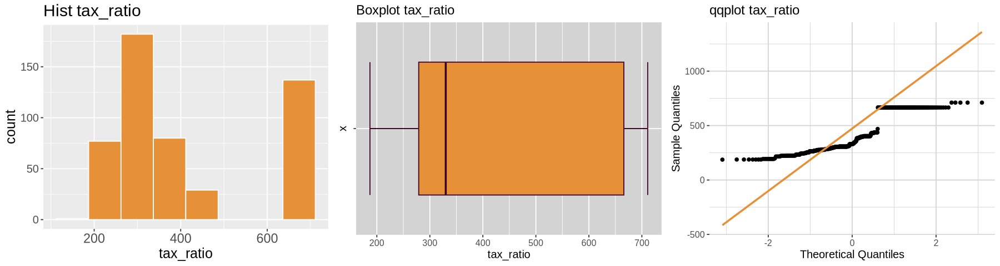

In [131]:
showVar(data$tax_ratio, "tax_ratio")

La distribucion de esta variable es bastante curiosa, ya que representando el indice de tasas podriamos esperar algo similar a una normal. Sin embargo nos encontramos una gran cantidad de gente que se concentra alrededor del valor 700, se podria estudiar la razón de esto y su efecto en el precio.


	Shapiro-Wilk normality test

data:  variable
W = 0.9036, p-value < 2.2e-16



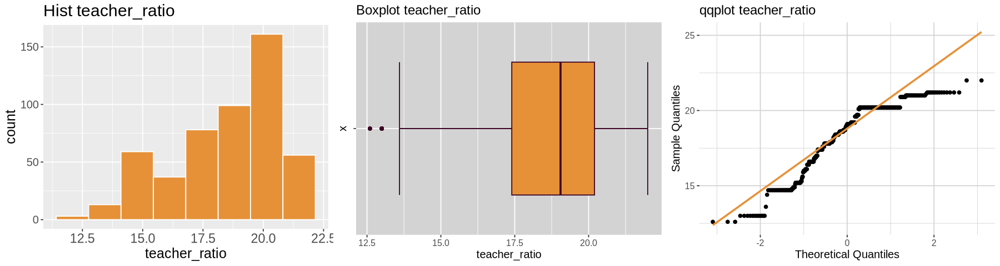

In [132]:
showVar(data$teacher_ratio, "teacher_ratio")

El ratio de alumno por profesor, es otra variable de la que a priori podriamos esperar una distribucion normal, y según el teorema del limite central, asi seria. Pero en los graficos vemos algo que si bien se le acerca, no es bien bien una normal. Además a priori esta variable no deberia tener un gran impacto en el precio pero ya veremos que observamos mas adelante.


	Shapiro-Wilk normality test

data:  variable
W = 0.47682, p-value < 2.2e-16



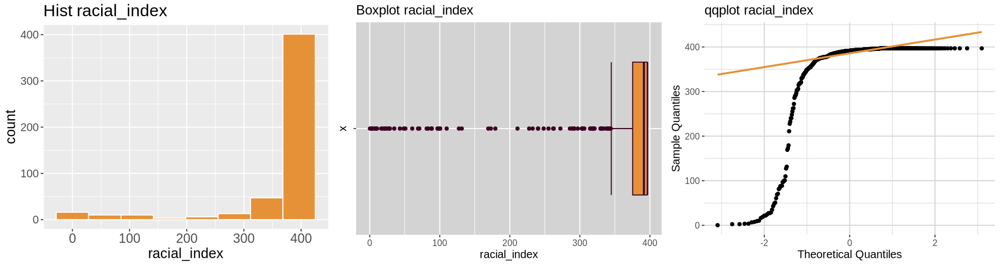

In [133]:
showVar(data$racial_index, "racial_index")

Curiosa distribución, como he comentado anteriormente parece que tenemos un Índice de proporción de población no caucásica realmente elevado centrando la mayor parte de la información en un índice muy elevado.


	Shapiro-Wilk normality test

data:  variable
W = 0.93691, p-value = 8.287e-14



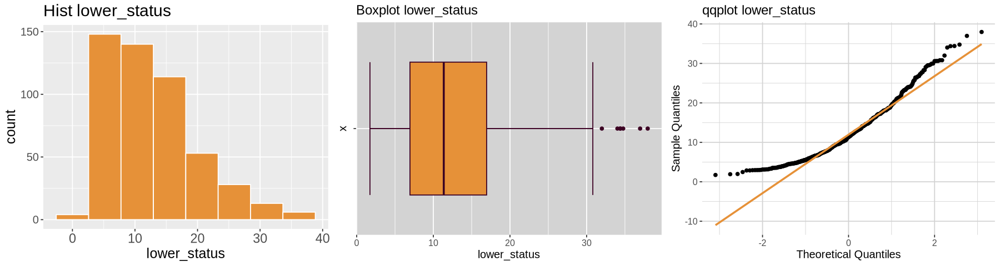

In [134]:
showVar(data$lower_status, "lower_status")

El porcentage de gente de clase baja es una variable a la que deberiamos echarle el ojo ya que la lógica dice que deberia afectar al precio de la zona y además su distribución es parecida a una normal.


	Shapiro-Wilk normality test

data:  variable
W = 0.91718, p-value = 4.941e-16



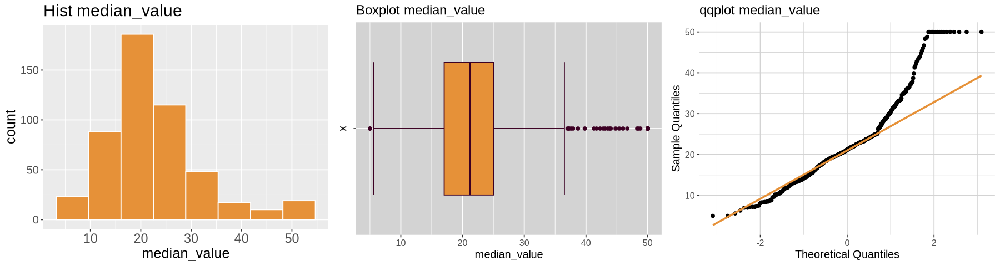

In [135]:
showVar(data$median_value, "median_value")

Y llegamos a la que en un futuro sera nuestra variable objetivo, obsrevamos un valor medio centrado alrededor de los 23000 euros con algunos outliers hacia los 40k+ que se cargan la distribución sin embargo es bastante bonita y con sentido.

A continuacion voy a graficar la distribucion de las categorias de la variable categorica medainte un gráfico de barras.

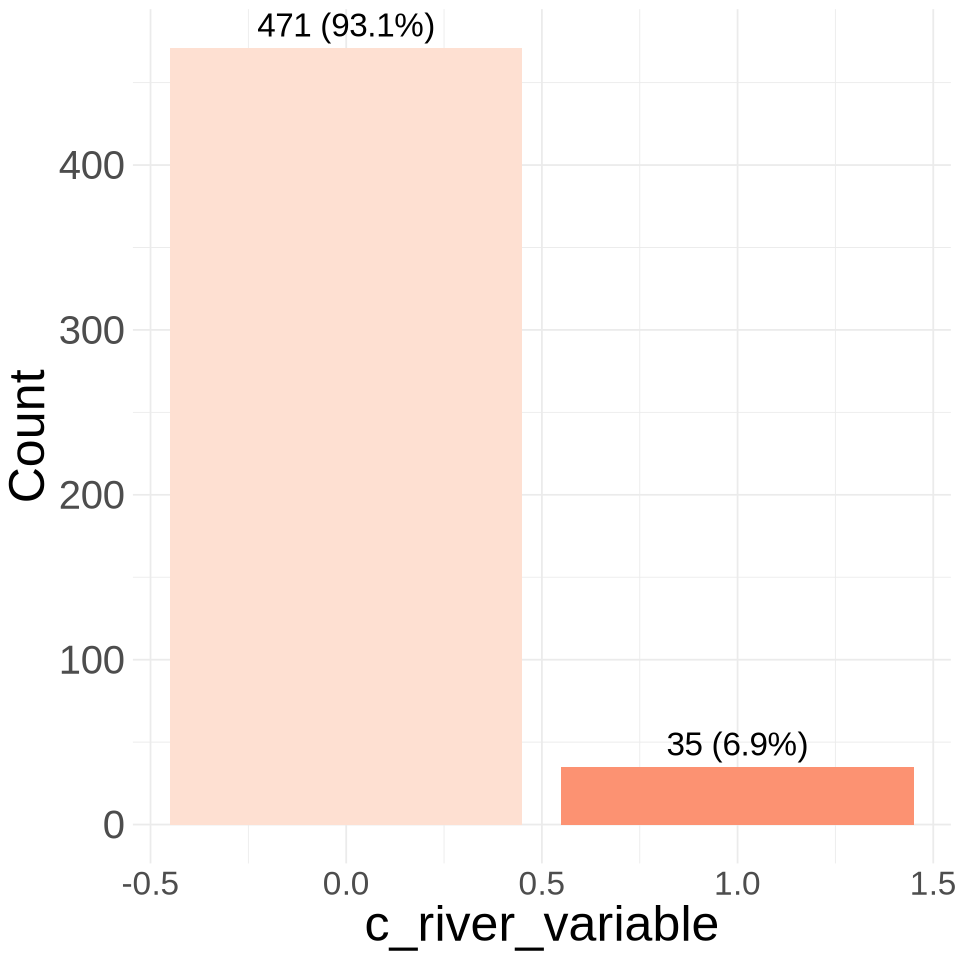

In [38]:
options(
  repr.plot.width = 8,  
  repr.plot.height = 8 
)

bar_plot = ggplot(data, aes(x = c_river_variable, fill = as.factor(c_river_variable))) +
    geom_bar(stat = 'count', position = 'dodge') +
    scale_fill_brewer(palette = 'Reds') + 
    labs( x = "c_river_variable", y = 'Count') +
    theme_minimal() +
    theme(legend.position = 'none', text = element_text(size = 30),axis.text.x = element_text(size = 20)) +
    geom_text(
      stat = 'count',
      aes(label = sprintf('%d (%.1f%%)', after_stat(count), after_stat(count) / sum(after_stat(count)) * 100)),
      position = position_dodge(0.9),
    vjust = -0.5,
    size=7
)
bar_plot

Observamos como la immensa mayoria de las muestras no son colindantes a un rio por lo que seguramente esta variable no vaya a aprotarnos demasiada información.

### Análisis de correlación y de componentes principales 

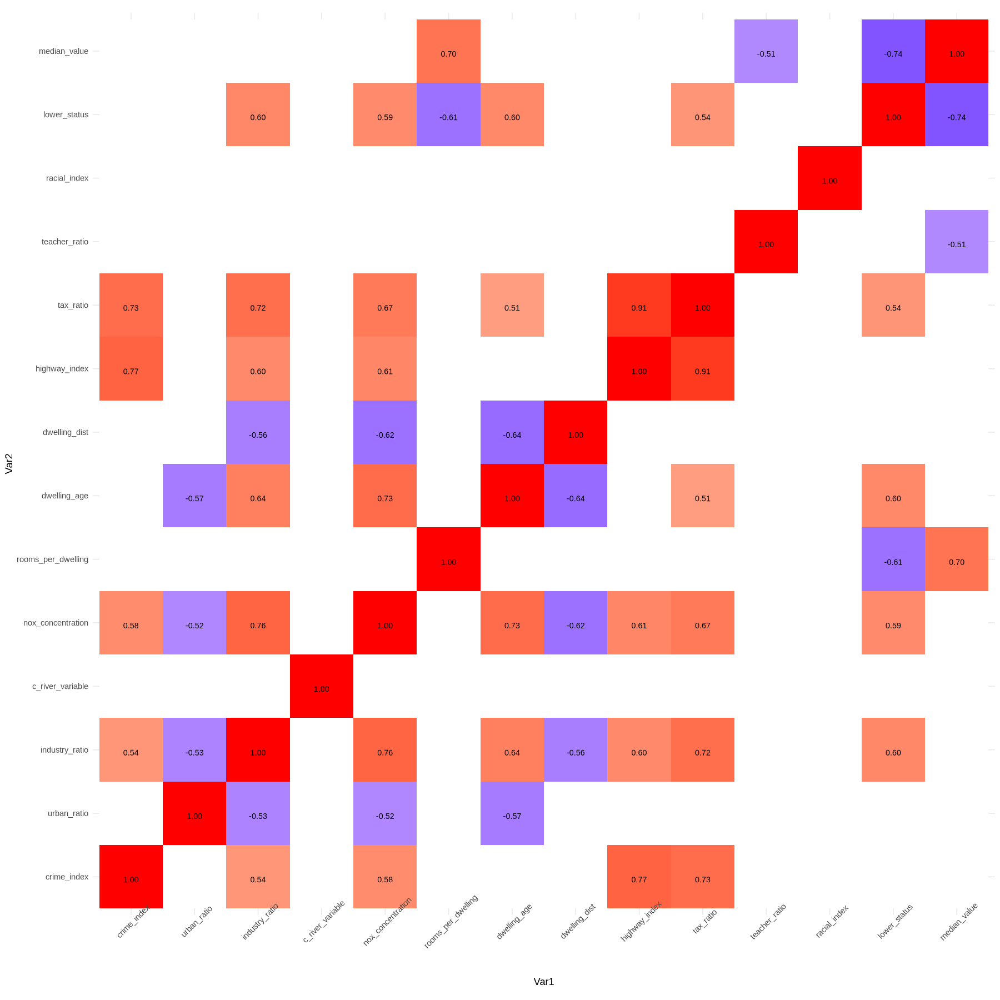

In [87]:
matriz_correlacion <- cor(data, use = "complete.obs")  # 'use' maneja los valores faltantes

# Convertir la matriz de correlación a un formato largo
data_long <- reshape2::melt(matriz_correlacion)

data_long$value[abs(data_long$value) < 0.5] <- NA

# Crear un Heatmap con las correlaciones menores a 0.4 en blanco
ggplot(data_long, aes(Var1, Var2, fill = value)) +
  geom_tile() +
  geom_text(aes(label = ifelse(is.na(value), "", sprintf("%.2f", value))), 
            color = "black", size = 3, vjust = 1) +
  scale_fill_gradientn(colors = c("blue", "white", "red"), 
                       values = scales::rescale(c(-1, 0, 1)), 
                       na.value = "white", 
                       limits = c(-1, 1)) +
  theme_minimal() +
  coord_fixed() +
  theme(axis.text.x = element_text(angle = 45, vjust = 1),
        legend.position = "none")

Aqui observamos la matriz de correlaciones de todas las variables entre ellas. Como se puede observar solo muestro aquellas que son superiores a 0.5 ya que sino al tener tantas variables el grafico se volvia demasiado caotico.

Tal y coomo vemos hay bastantes correlaciones fuertes, sin embargo nuestra variable objetivo no tiene correlaciones especialmente fuertes. Para poder apreciar estas mejor voy a mostrar unicamente las correlaciones de la variable objetivo.

In [57]:
correlation_matrix <- cor(data, data$median_value)
print(correlation_matrix)


                         [,1]
crime_index        -0.3223877
urban_ratio         0.3604453
industry_ratio     -0.4837252
c_river_variable    0.1752602
nox_concentration  -0.4273208
rooms_per_dwelling  0.6953599
dwelling_age       -0.3769546
dwelling_dist       0.1780964
highway_index      -0.3816262
tax_ratio          -0.4685359
teacher_ratio      -0.5077867
racial_index        0.3334608
lower_status       -0.7376627
median_value        1.0000000


A excepción de lower_status la cual ya habia previsto que influiria bastante en nuestra variable objetivo y rooms_per_dwelling, observamos como el resto de variables no tiene una potente correlacion con la variable objetivo.

In [65]:
selected_columns <- colnames(data)[abs(correlation_matrix) >= 0.45]

# Selecciona las columnas del dataframe
data_seleccionado <- data[, selected_columns]

A continuación voy a grafica una nueva matriz de correlaciones esta vez, con las distribuciones de las variables, pero únicamente voy a seleccionar aquellas variables que guarden más relacion con la variable objetivo.

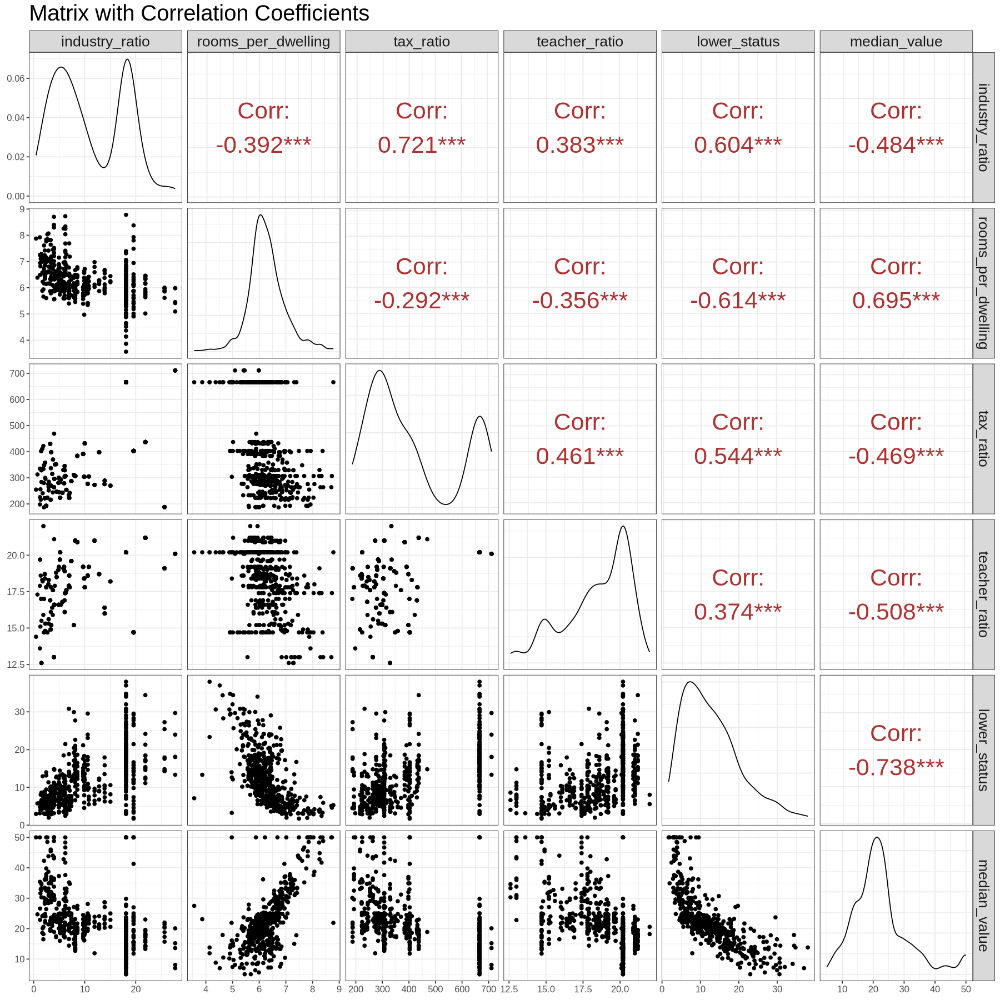

In [115]:
options(
  repr.plot.width = 15,  
  repr.plot.height = 15 
)

ggpairs(
  data_seleccionado,
  title = "Matrix with Correlation Coefficients",
  upper = list(continuous = wrap("cor", size = 9, color ='#ad3232'))) +
theme_bw() +
theme(
  text = element_text(size = 20), 
  axis.text = element_text(size = 10),
  axis.title = element_text(size = 15)
)

Observamos como mediante las distribuciones las únicas variables que parecen guardar una relacion són efectivamente las mencionadas anteriormente. lower_status con una fuerte relacion polinómica y rooms_per_dwelling con una relacion no tant fuerte, pero lineal.

Una vez completado el analisis de correlaciones me dispongo a realizar el analisis de factores.

In [141]:
data_fa1<-factanal(data, factors = 1)
data_fa1
data_fa2<-factanal(data, factors = 2)
data_fa2


Call:
factanal(x = data, factors = 1)

Uniquenesses:
       crime_index        urban_ratio     industry_ratio   c_river_variable 
             0.496              0.708              0.289              1.000 
 nox_concentration rooms_per_dwelling       dwelling_age      dwelling_dist 
             0.308              0.823              0.488              0.655 
     highway_index          tax_ratio      teacher_ratio       racial_index 
             0.342              0.252              0.780              0.782 
      lower_status       median_value 
             0.491              0.656 

Loadings:
                   Factor1
crime_index         0.710 
urban_ratio        -0.540 
industry_ratio      0.843 
c_river_variable          
nox_concentration   0.832 
rooms_per_dwelling -0.421 
dwelling_age        0.715 
dwelling_dist      -0.588 
highway_index       0.811 
tax_ratio           0.865 
teacher_ratio       0.469 
racial_index       -0.467 
lower_status        0.714 
median_value     


Call:
factanal(x = data, factors = 2)

Uniquenesses:
       crime_index        urban_ratio     industry_ratio   c_river_variable 
             0.386              0.565              0.264              0.992 
 nox_concentration rooms_per_dwelling       dwelling_age      dwelling_dist 
             0.256              0.779              0.332              0.544 
     highway_index          tax_ratio      teacher_ratio       racial_index 
             0.075              0.088              0.767              0.776 
      lower_status       median_value 
             0.441              0.652 

Loadings:
                   Factor1 Factor2
crime_index         0.761   0.184 
urban_ratio        -0.199  -0.629 
industry_ratio      0.551   0.658 
c_river_variable                  
nox_concentration   0.532   0.678 
rooms_per_dwelling -0.170  -0.438 
dwelling_age        0.348   0.739 
dwelling_dist      -0.281  -0.614 
highway_index       0.949   0.153 
tax_ratio           0.915   0.272 
teacher_ra

De este analisis debemos mencionar toda una serie de cosas. Para empezar, la uniqueness de nuestras variables, voy a centrarme sobretodo en aquellas 3 variables que han demostrado guardar mas relacion con nuestra variable objetivo.

De aqui exatraemos que la variable rooms_per dweeling tiene un factor de uniqueness muy alto por lo que no debe estar altamente correlacionado con el resto de variables, sin embargo la variable lower_status recibe un valor bastante pequeño asi que si voy a usarlo en una regresiond deberia asegurarme de no usarlo con otra variable con la que tenga una fuerte correlacion ya que podria introducir ruido en el modelo.

Al mismo tiempo observamos que la misma variable con alto valor de uniqueness, es mucho menos relevante en el calculo de los factores que otras variables como por ejemplo lower_staus o sobretodo, tax_ratio y highway_index que a priori no habia ni pensado en incluir en el modelo.

Aun así observamos como con 2 factores, estariamos explicando a duras penas el 50% de la varianza con lo que estariamos perdiendo información potencialmente útil para nuestro modelo.

In [143]:
Lambda <- data_fa2$loadings
Psi <- diag(data_fa2$uniquenesses)
S <- data_fa2$correlation
Sigma <- Lambda %*% t(Lambda) + Psi
round(S,6)
round(S - Sigma, 6)

,crime_index,urban_ratio,industry_ratio,c_river_variable,nox_concentration,rooms_per_dwelling,dwelling_age,dwelling_dist,highway_index,tax_ratio,teacher_ratio,racial_index,lower_status,median_value
crime_index,1.000000,-0.260778,0.537426,0.033911,0.583608,-0.146126,0.413297,-0.345409,0.767352,0.727160,0.329369,-0.328354,0.377829,-0.322388
urban_ratio,-0.260778,1.000000,-0.533828,-0.042697,-0.516604,0.311991,-0.569537,0.496005,-0.311948,-0.314563,-0.391679,0.175520,-0.412995,0.360445
industry_ratio,0.537426,-0.533828,1.000000,0.062938,0.763651,-0.391676,0.644779,-0.556055,0.595129,0.720760,0.383248,-0.356977,0.603800,-0.483725
c_river_variable,0.033911,-0.042697,0.062938,1.000000,0.091203,0.091251,0.086518,-0.111923,-0.007368,-0.035587,-0.121515,0.048788,-0.053929,0.175260
nox_concentration,0.583608,-0.516604,0.763651,0.091203,1.000000,-0.302188,0.731470,-0.615223,0.611441,0.668023,0.188933,-0.380051,0.590879,-0.427321
rooms_per_dwelling,-0.146126,0.311991,-0.391676,0.091251,-0.302188,1.000000,-0.240265,0.145943,-0.209847,-0.292048,-0.355501,0.128069,-0.613808,0.695360
dwelling_age,0.413297,-0.569537,0.644779,0.086518,0.731470,-0.240265,1.000000,-0.642802,0.456022,0.506456,0.261515,-0.273534,0.602339,-0.376955
dwelling_dist,-0.345409,0.496005,-0.556055,-0.111923,-0.615223,0.145943,-0.642802,1.000000,-0.377759,-0.408909,-0.137367,0.224780,-0.426786,0.178096
highway_index,0.767352,-0.311948,0.595129,-0.007368,0.611441,-0.209847,0.456022,-0.377759,1.000000,0.910228,0.464741,-0.444413,0.488676,-0.381626
tax_ratio,0.727160,-0.314563,0.720760,-0.035587,0.668023,-0.292048,0.506456,-0.408909,0.910228,1.000000,0.460853,-0.441808,0.543993,-0.468536


,crime_index,urban_ratio,industry_ratio,c_river_variable,nox_concentration,rooms_per_dwelling,dwelling_age,dwelling_dist,highway_index,tax_ratio,teacher_ratio,racial_index,lower_status,median_value
crime_index,-0.000002,0.006593,-0.003180,0.047566,0.053271,0.064178,0.012019,-0.018150,0.016395,-0.019917,-0.043583,0.034780,-0.049312,0.031273
urban_ratio,0.006593,0.000016,-0.010715,0.000294,0.015727,0.002949,-0.035417,0.053907,-0.026616,0.038780,-0.185640,-0.036201,0.061749,-0.007838
industry_ratio,-0.003180,-0.010715,0.000004,0.030749,0.024180,-0.009940,-0.033407,0.002906,-0.028693,0.037377,0.015308,0.011313,-0.033341,0.021410
c_river_variable,0.047566,0.000294,0.030749,0.000008,0.056679,0.120006,0.040196,-0.073146,0.015796,-0.023229,-0.119906,0.048930,-0.088809,0.200327
nox_concentration,0.053271,0.015727,0.024180,0.056679,0.000001,0.085383,0.044542,-0.048852,0.001992,-0.004051,-0.174637,-0.015538,-0.051532,0.081111
rooms_per_dwelling,0.064178,0.002949,-0.009940,0.120006,0.085383,0.000001,0.142713,-0.170832,0.018921,-0.016991,-0.197937,-0.032936,-0.270229,0.427823
dwelling_age,0.012019,-0.035417,-0.033407,0.040196,0.044542,0.142713,0.000004,-0.090655,0.012193,-0.013527,-0.031535,0.024341,-0.002852,0.096138
dwelling_dist,-0.018150,0.053907,0.002906,-0.073146,-0.048852,-0.170832,-0.090655,-0.000006,-0.016655,0.015726,0.102516,-0.019241,0.072667,-0.212105
highway_index,0.016395,-0.026616,-0.028693,0.015796,0.001992,0.018921,0.012193,-0.016655,0.000000,-0.000553,0.013972,-0.006975,0.003880,0.023039
tax_ratio,-0.019917,0.038780,0.037377,-0.023229,-0.004051,-0.016991,-0.013527,0.015726,-0.000553,0.000000,0.002913,0.005046,-0.001318,-0.019196


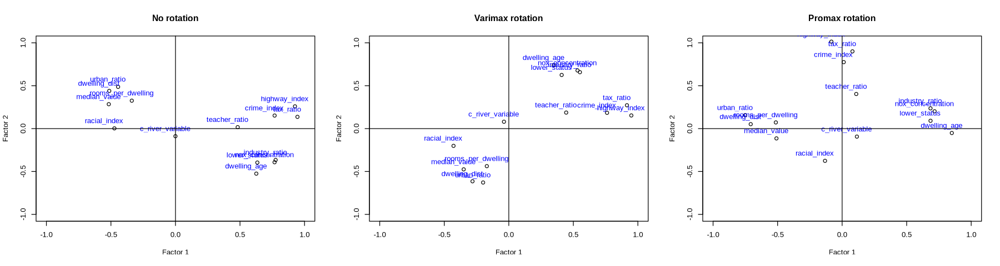

In [145]:
data_fa_none <- factanal(data, factors = 2, rotation = "none")
data_fa_varimax <- factanal(data, factors = 2, rotation = "varimax")
data_fa_promax <- factanal(data, factors = 2, rotation = "promax")

par(mfrow = c(1,3))
plot(data_fa_none$loadings[,1], 
     data_fa_none$loadings[,2],
     xlab = "Factor 1", 
     ylab = "Factor 2", 
     ylim = c(-1,1),
     xlim = c(-1,1),
     main = "No rotation")

text(data_fa_none$loadings[,1]-0.08, 
     data_fa_none$loadings[,2]+0.08,
      colnames(data),
      col="blue")

abline(h = 0, v = 0)

plot(data_fa_varimax$loadings[,1], 
     data_fa_varimax$loadings[,2],
     xlab = "Factor 1", 
     ylab = "Factor 2", 
     ylim = c(-1,1),
     xlim = c(-1,1),
     main = "Varimax rotation")

text(data_fa_varimax$loadings[,1]-0.08, 
     data_fa_varimax$loadings[,2]+0.08,
      colnames(data),
      col="blue")
abline(h = 0, v = 0)

plot(data_fa_promax$loadings[,1], 
     data_fa_promax$loadings[,2],
     xlab = "Factor 1", 
     ylab = "Factor 2",
     ylim = c(-1,1),
     xlim = c(-1,1),
     main = "Promax rotation")

text(data_fa_promax$loadings[,1]-0.08, 
     data_fa_promax$loadings[,2]+0.08,
      colnames(data),
      col="blue")

abline(h = 0, v = 0)

Con estos gráficos podemos visualizar como la variable categórica no aporta información para los factores y que el resto de variables podrian guardar una fuerte relacion entre ellas.

Importance of components:
                          Comp.1    Comp.2    Comp.3     Comp.4     Comp.5
Standard deviation     2.5379733 1.2947589 1.1780506 0.93882896 0.92959813
Proportion of Variance 0.4600935 0.1197429 0.0991288 0.06295713 0.06172519
Cumulative Proportion  0.4600935 0.5798364 0.6789652 0.74192230 0.80364749
                           Comp.6     Comp.7     Comp.8     Comp.9    Comp.10
Standard deviation     0.82762622 0.65235655 0.61812160 0.59155526 0.51385424
Proportion of Variance 0.04892608 0.03039779 0.02729102 0.02499554 0.01886044
Cumulative Proportion  0.85257358 0.88297137 0.91026239 0.93525793 0.95411838
                          Comp.11    Comp.12    Comp.13     Comp.14
Standard deviation     0.47936245 0.44107531 0.39777683 0.244500604
Proportion of Variance 0.01641345 0.01389625 0.01130189 0.004270039
Cumulative Proportion  0.97053183 0.98442807 0.99572996 1.000000000


Loadings:
                   Comp.1 Comp.2 Comp.3 Comp.4 Comp.5 Comp.6 Comp.7 Comp.8
crime_index         0.274  0.188  0.376  0.152         0.240  0.209       
urban_ratio        -0.242         0.382 -0.105 -0.397  0.368 -0.557       
industry_ratio      0.335                                     0.194 -0.145
c_river_variable           0.379 -0.226  0.655 -0.565 -0.214              
nox_concentration   0.330  0.218 -0.112 -0.148         0.178  0.242  0.133
rooms_per_dwelling -0.201  0.493  0.223 -0.121  0.264 -0.213 -0.193  0.433
dwelling_age        0.298  0.189 -0.294 -0.132  0.105        -0.255  0.544
dwelling_dist      -0.244 -0.312  0.314  0.189 -0.168         0.459  0.595
highway_index       0.312  0.123  0.410  0.124                            
tax_ratio           0.332         0.345                0.136        -0.102
teacher_ratio       0.210 -0.308  0.153  0.456  0.411 -0.383 -0.361       
racial_index       -0.196        -0.263  0.454  0.378  0.704              
lower_status  

,Comp.1,Comp.2,Comp.3,Comp.4,Comp.5,Comp.6,Comp.7,Comp.8,Comp.9,Comp.10,Comp.11,Comp.12,Comp.13,Comp.14
1,-1.79191122,0.82314773,-0.9822570,-1.092793335,1.625485e-01,0.4502740,-0.28875233,-0.64971631,0.90667145,0.230701090,-0.01468350,-0.96863383,0.504422276,0.2470604159
2,-1.44389887,-0.49049970,-0.8271457,-0.115927612,4.683338e-01,-0.2921849,0.36467407,0.75684867,0.27649951,0.048709252,0.20194690,0.06469589,0.497856393,-0.1073449392
3,-2.44360792,0.75905321,-0.1953096,-0.110127326,1.112057e+00,-0.6608803,0.56995637,0.42636509,-0.07063883,-0.009723177,0.09619618,0.30284889,-0.013833445,0.0263366671
4,-2.86950884,0.13704532,0.2050237,0.304652884,1.101156e+00,-0.8714370,0.71030623,0.39399123,0.31339949,-0.172145500,0.18952191,-0.03471959,-0.322497708,0.0515577497
5,-2.80530286,0.36079059,0.1198802,0.212325257,1.173285e+00,-0.8553113,0.49402828,0.66506084,0.29047312,-0.346168967,0.22266153,0.26127747,-0.469039050,0.1093430210
6,-2.33472657,-0.48766538,-0.1872207,0.305885500,7.607435e-01,-0.6527286,0.64071834,0.46913096,0.47074360,-0.241236231,0.55401440,-0.06381444,-0.081872964,-0.0008826266
7,-1.35528475,-0.43684350,-0.5697497,-0.596701912,-5.955216e-01,0.6841913,0.81790630,0.46020719,0.11771013,-0.506727836,0.07958564,0.10138599,0.267816688,-0.0837711432
8,-0.96287857,-0.18797879,-0.9058994,-0.830746538,-5.922952e-01,0.7717758,0.30067650,1.35377664,0.08896115,-0.959054043,0.35800704,0.80024580,0.073096881,0.0225374976
9,0.01672316,-1.44924545,-1.3766637,-0.959980762,-1.415359e+00,1.0380240,-0.04692988,1.69676509,0.48236652,-1.105071451,-0.11793316,1.04609544,0.002451742,0.0249900031
10,-0.92089382,-0.80747371,-0.7359531,-0.715832596,-8.789651e-01,0.7005311,0.64478890,1.32492635,0.13616572,-0.646776200,0.11418089,0.29947177,0.390691742,-0.0958243104


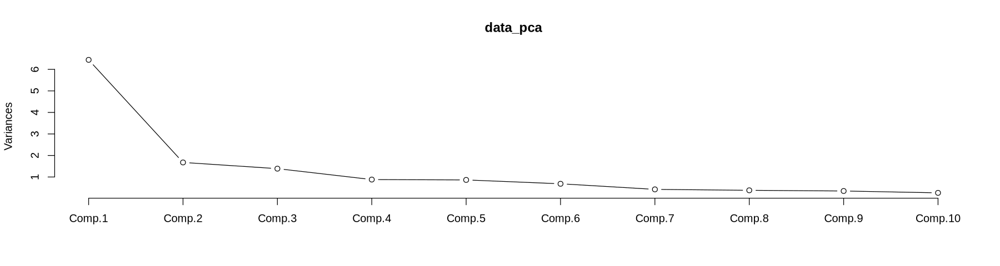

In [191]:
data_pca<-princomp(data, cor = TRUE)
summary(data_pca)
loadings(data_pca)
plot(data_pca, type="lines")
data_pca$scores

Con este gráfico apreciamos que para un PCA o un cambio de factores como mucho deberiamos usar 3 factores para describir nuestro escenareo ya que a partir del cuarto factor la información que se aporta en negligible.

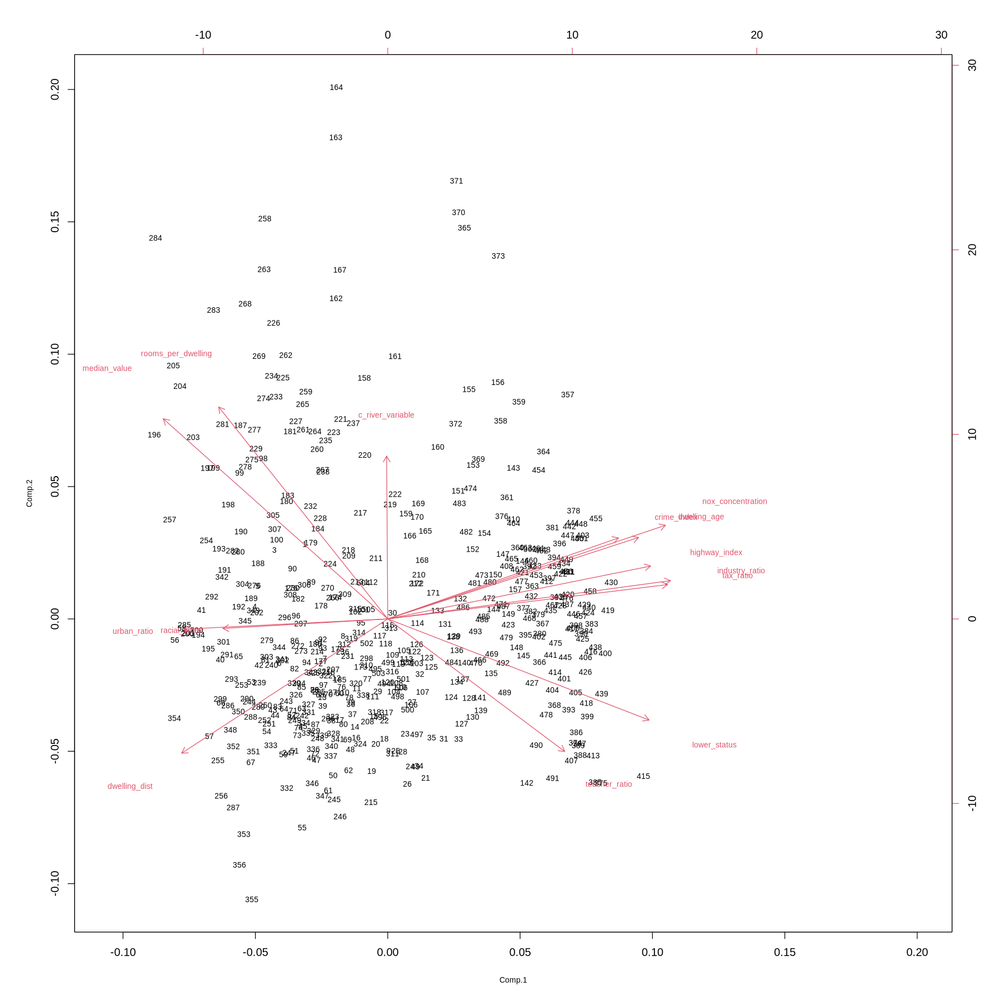

In [206]:
options(repr.plot.width = 15, repr.plot.height = 15)

biplot(data_pca, cex = 0.7, cex.lab = 0.7)

Aqui vemos como la variable que mas destaca del resto es la categorica que se desmarca del resto por razones obvias, ademas de esto si queremos usar variables que aporten información completamente distinta a nuestro modelo deberiamos usar variables con una relación ortogonal o parecido, como el rooms_per_dwelling con dwelling_dist, sin embargo todo debera ponerse en una balanza junto con las correlaciones con la variable objetivo y la normalidad de nuestras variables.

In [239]:
data_factpca<-factanal(data_pca$scores, factors = 3)
data_factpca


Call:
factanal(x = data_pca$scores, factors = 3)

Uniquenesses:
 Comp.1  Comp.2  Comp.3  Comp.4  Comp.5  Comp.6  Comp.7  Comp.8  Comp.9 Comp.10 
  1.000   1.000   1.000   1.000   1.000   1.000   1.000   1.000   0.893   1.000 
Comp.11 Comp.12 Comp.13 Comp.14 
  1.000   1.000   0.893   0.893 

Loadings:
        Factor1 Factor2 Factor3
Comp.1                         
Comp.2                         
Comp.3                         
Comp.4                         
Comp.5                         
Comp.6                         
Comp.7                         
Comp.8                         
Comp.9                   0.326 
Comp.10                        
Comp.11                        
Comp.12                        
Comp.13  0.132   0.299         
Comp.14  0.298  -0.133         

               Factor1 Factor2 Factor3
SS loadings      0.107   0.107   0.107
Proportion Var   0.008   0.008   0.008
Cumulative Var   0.008   0.015   0.023

Test of the hypothesis that 3 factors are sufficient.
The 

### Análisis de ANOVA

#### Comprovacion de supuestos

##### Normalidad

In [161]:
variables = colnames(data[, -4])
categorias = c( 0, 1)
resultados <- data.frame(Variable = character(), Cat = character(), Shapiro = numeric(), PValor = numeric(), row.names = NULL)

for (variable in variables) {
  for (cat in categorias) {
    data_subset = subset(data, c_river_variable == cat)
    result = shapiro.test(data_subset[, variable])
    resultados = rbind(resultados, data.frame(Variable = variable, Cat = cat, Shapiro = result$statistic, PValor = round(result$p.value, 3)))
  }
}

print(resultados)

              Variable Cat   Shapiro PValor
W          crime_index   0 0.5970073  0.000
W1         crime_index   1 0.6963937  0.000
W2         urban_ratio   0 0.5609153  0.000
W3         urban_ratio   1 0.4798219  0.000
W4      industry_ratio   0 0.8974442  0.000
W5      industry_ratio   1 0.8589682  0.000
W6   nox_concentration   0 0.9385549  0.000
W7   nox_concentration   1 0.8714961  0.001
W8  rooms_per_dwelling   0 0.9621043  0.000
W9  rooms_per_dwelling   1 0.9481502  0.099
W10       dwelling_age   0 0.8946101  0.000
W11       dwelling_age   1 0.8424522  0.000
W12      dwelling_dist   0 0.9341595  0.000
W13      dwelling_dist   1 0.9562894  0.177
W14      highway_index   0 0.6801004  0.000
W15      highway_index   1 0.6649161  0.000
W16          tax_ratio   0 0.8168932  0.000
W17          tax_ratio   1 0.7809569  0.000
W18      teacher_ratio   0 0.8985897  0.000
W19      teacher_ratio   1 0.8975781  0.003
W20       racial_index   0 0.4817410  0.000
W21       racial_index   1 0.428

Observamos que el supuesto de la normalidad solo se cumple con la variable rooms_per_dwelling y dwelling_dist cuando la vivienda es colindante a un rio, asi que podemos concluir que no cumple este supuesto.

##### Homocedasticidad

In [162]:
resultados_bartlett = data.frame(Variable = character(), Estadistico = numeric(), PValor = numeric(), row.names = NULL)

for (variable in variables) {
  resultado_bartlett = bartlett.test(get(variable) ~ c_river_variable, data = data)
  resultados_bartlett = rbind(resultados_bartlett, data.frame(Variable = variable, Estadistico = resultado_bartlett$statistic, PValor = resultado_bartlett$p.value))
}

print(resultados_bartlett)

                                 Variable Estadistico       PValor
Bartlett's K-squared          crime_index  0.10764547 0.7428408254
Bartlett's K-squared1         urban_ratio  2.87243440 0.0901084767
Bartlett's K-squared2      industry_ratio  1.27819138 0.2582355879
Bartlett's K-squared3   nox_concentration  4.41180656 0.0356910244
Bartlett's K-squared4  rooms_per_dwelling  4.35444241 0.0369125410
Bartlett's K-squared5        dwelling_age  3.57308477 0.0587231282
Bartlett's K-squared6       dwelling_dist 10.55400183 0.0011593680
Bartlett's K-squared7       highway_index  0.20982417 0.6469052502
Bartlett's K-squared8           tax_ratio  0.03282348 0.8562321684
Bartlett's K-squared9       teacher_ratio  0.07546907 0.7835341731
Bartlett's K-squared10       racial_index 14.47853527 0.0001417658
Bartlett's K-squared11       lower_status  0.29302631 0.5882876935
Bartlett's K-squared12       median_value  6.31554125 0.0119684206


Como todos los p-valores son mayores a 0.05 no puedo rechazar la hipótesis nula, lo que sugiere que no hay evidencia suficiente para decir que las varianzas son diferentes asi que asumo que se cumple el supuesto de homocedasticidad.

#### Test

Para el test anova he escogido la única variable categorica del dataset.

ERROR: Error in legend(x = "topright", fill = c("#3d85c6", "#e69138")): argument "legend" is missing, with no default


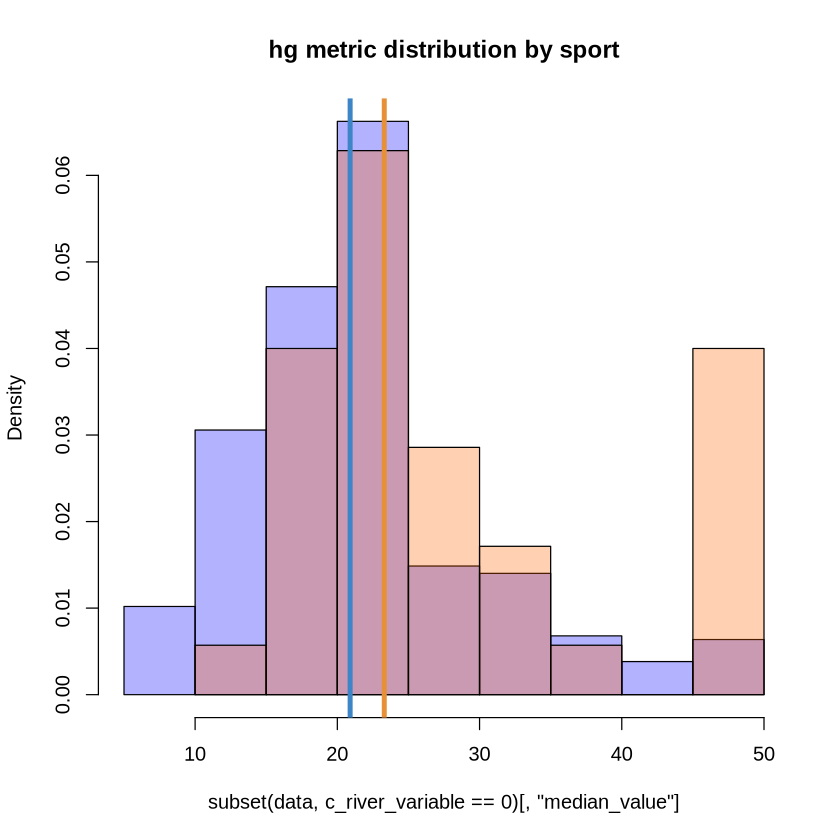

In [163]:
options(
  repr.plot.width = 7,  
  repr.plot.height = 7  
)

hist(subset(data,c_river_variable==0)[,'median_value'],
    col = rgb(0,0,1,0.3),
    main = 'hg metric distribution by sport',
    freq = F)
hist(subset(data,c_river_variable==1)[,'median_value'],
    col = rgb(1,0.4,0,0.3),
    add = T,
    freq = F)

abline(v = median(subset(data, c_river_variable==0)[,'median_value']), col = '#3d85c6', lwd = 4)
abline(v = median(subset(data, c_river_variable==1)[,'median_value']), col = '#e69138', lwd = 4)

legend(x = "topright", fill = c('#3d85c6', '#e69138'))

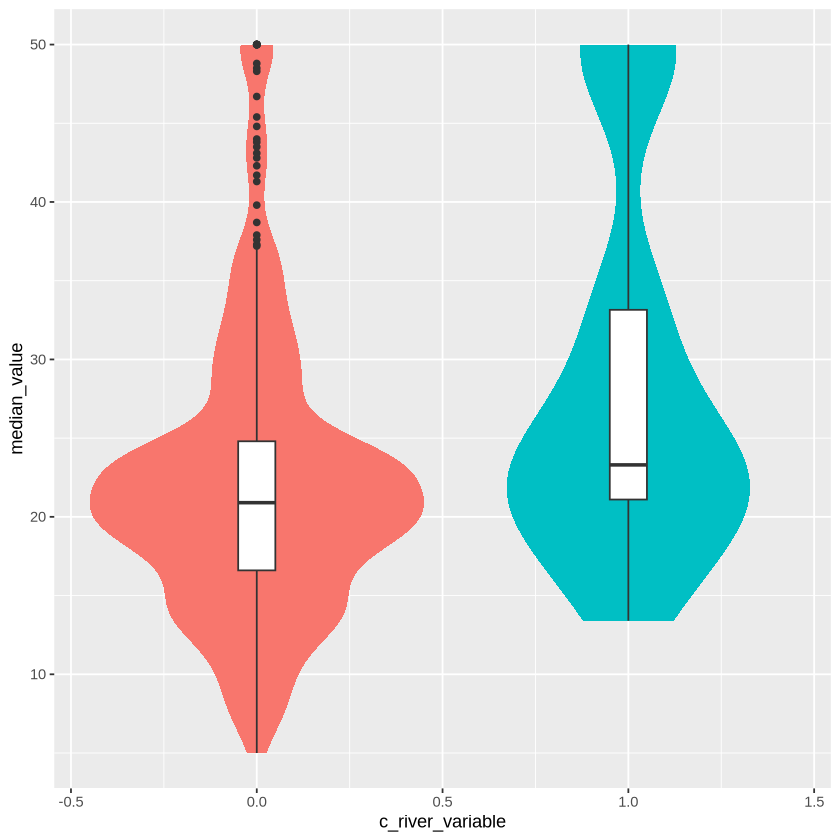

In [170]:
ggplot(data, aes(c_river_variable, median_value, group = c_river_variable)) +
  geom_violin(color = NA,aes(fill = factor(c_river_variable))) +
  theme(legend.position = 'none') +
  geom_boxplot(width = 0.1) 

Como vemos se puede apreciar una diferencia en la media y la distribucion en nuestra variable objetivo generada por las categorias de la variable c_river_variable.

In [176]:
data <- na.omit(data)

In [177]:
anova = aov(median_value ~ c_river_variable, data = data)
summary(anova)

                  Df Sum Sq Mean Sq F value   Pr(>F)    
c_river_variable   1   1312  1312.1   15.97 7.39e-05 ***
Residuals        504  41404    82.2                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

P-valor muy pequeño, rechazamos hipotesis nula. Esto sugiere que el precio de la casa se ve afectado si esta es colindante a un rio. 

In [178]:
resultados_anova = data.frame(Variable = character(), F_Value = numeric(), P_Value = numeric(), row.names = NULL)
variables = colnames(data[, -4])
for (variable in variables) {
  formula = as.formula(paste(variable, '~ c_river_variable'))
  anova_result = aov(formula, data = data)
  
  # Extraer F value y p-value
  f_value = summary(anova_result)[[1]][['F value']][1]
  p_value = summary(anova_result)[[1]][['Pr(>F)']][1]
 resultados_anova = rbind(resultados_anova, data.frame(Variable = variable, F_Value = f_value, P_Value = p_value))
}

# Muestra los resultados de ANOVA
print(resultados_anova)

             Variable     F_Value      P_Value
1         crime_index  0.58024688 4.465719e-01
2         urban_ratio  0.92047499 3.378103e-01
3      industry_ratio  2.00438218 1.574628e-01
4   nox_concentration  4.22741120 4.029050e-02
5  rooms_per_dwelling  4.23193863 4.018410e-02
6        dwelling_age  3.80105607 5.177446e-02
7       dwelling_dist  6.39354626 1.175773e-02
8       highway_index  0.02736414 8.686789e-01
9           tax_ratio  0.63907504 4.244225e-01
10      teacher_ratio  7.55356798 6.203916e-03
11       racial_index  1.20254183 2.733379e-01
12       lower_status  1.47009366 2.258990e-01
13       median_value 15.97151242 7.390623e-05


Como se aprecia en los resultados, esta variable categorica afecta a alguna variable más además de la objetivo, sin embargo vemos tambien que es a esta última a la que más afecta con diferencia.

### Desarrollo y justificación de las variables

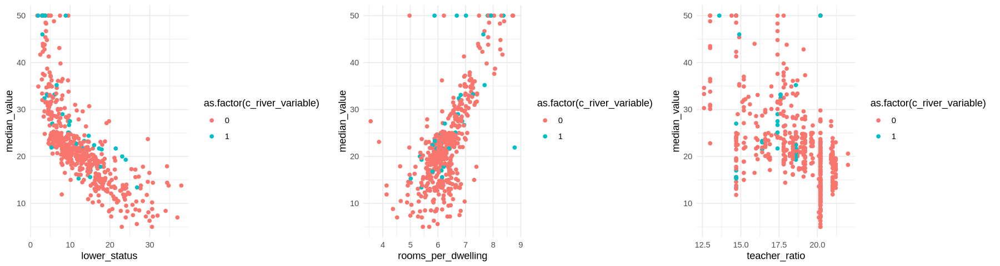

In [188]:
plotss = list()
    
grafico1 = ggplot(data, aes(x = lower_status, y = median_value, color = as.factor(c_river_variable))) +
    geom_point() +
    theme_minimal()
plotss[['1']] = grafico1
    
grafico2 = ggplot(data, aes(x = rooms_per_dwelling, y = median_value, color = as.factor(c_river_variable))) +
    geom_point() +
    theme_minimal()
plotss[['2']] = grafico2
    
    
grafico3 = ggplot(data, aes(x = teacher_ratio, y = median_value, color = as.factor(c_river_variable))) +
    geom_point() +
    theme_minimal()
plotss[['3']] = grafico3
    
options(
    repr.plot.width = 15,  
    repr.plot.height = 4 
)
grid.arrange(grobs = plotss, ncol = 3, widths = rep(2, 3))

La primera idea que tenia era la de usar la variable categorica para el modelo ya que por el test ANOVA habiamos visto que era significativa, sin embargo al realizar scatterplots de la variable objetivo junto con las 3 variables de mayor correlacion y colorear por categoria, he visto que la categoria no parece influir, o almenos no parece guardar una relacion con la variables objetivo. Para asegurarme de ello voy a realizar un scatterplot de la variable objetivo contra la categorica.

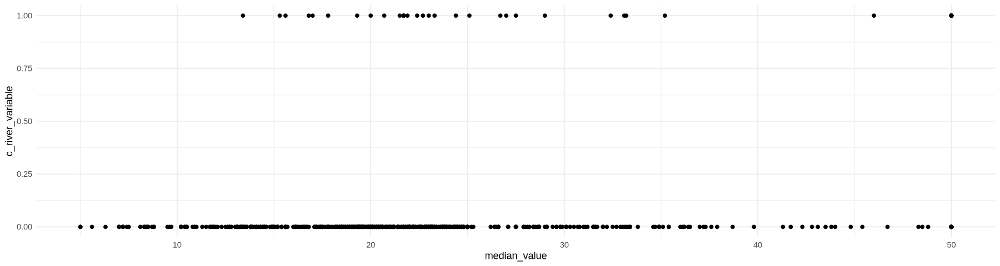

In [190]:
ggplot(data, aes(x = median_value, y = c_river_variable)) +
    geom_point() +
    theme_minimal()

Como se aprecia, el precio medio de la vivienda no parece ser influido por el hecho de ser colindante a un rio, así que la descartaré de mi modelo.

Antes de crear el modelo quiero asegurarme de que no haya una alta correlacion entre las variables que voy a usar para el modelo.

In [207]:
mc <- cor(data[, c("lower_status", "rooms_per_dwelling", "teacher_ratio")], use = "complete.obs")
print(mc)

                   lower_status rooms_per_dwelling teacher_ratio
lower_status          1.0000000         -0.6138083     0.3740443
rooms_per_dwelling   -0.6138083          1.0000000    -0.3555015
teacher_ratio         0.3740443         -0.3555015     1.0000000


Vemos que la variable teacher_ratio no esta correlacionada con niguna otra, sin embargo las otras dos si que parecen guardar un poco de relacion. Aun así procederé con las 3 variables para la realización de mi modelo de regresión.

### Estudio de regresión lineal del median_value

In [213]:
library(caret)
library(lmtest)
library(broom)

Loading required package: lattice


Attaching package: ‘caret’


The following object is masked from ‘package:purrr’:

    lift


Loading required package: zoo


Attaching package: ‘zoo’


The following objects are masked from ‘package:base’:

    as.Date, as.Date.numeric




In [220]:
set.seed(500) 

inTrain = createDataPartition(y = data$median_value
                              ,p = 0.7
                              , list = FALSE
                              , times = 1)

data_train  = data[inTrain, c("lower_status", "rooms_per_dwelling", "teacher_ratio", "median_value")]
data_test = data[-inTrain, c("lower_status", "rooms_per_dwelling", "teacher_ratio", "median_value")]

In [221]:
str(data_train)

'data.frame':	356 obs. of  4 variables:
 $ lower_status      : num  4.98 9.14 2.94 5.33 12.43 ...
 $ rooms_per_dwelling: num  6.58 6.42 7 7.15 6.01 ...
 $ teacher_ratio     : num  15.3 17.8 18.7 18.7 15.2 15.2 15.2 15.2 15.2 15.2 ...
 $ median_value      : num  24 21.6 33.4 36.2 22.9 27.1 18.9 15 18.9 21.7 ...


In [223]:
modelo_lm = lm(median_value ~ rooms_per_dwelling +teacher_ratio, data = data_train)
summary(modelo_lm)


Call:
lm(formula = median_value ~ rooms_per_dwelling + teacher_ratio, 
    data = data_train)

Residuals:
    Min      1Q  Median      3Q     Max 
-16.388  -3.003   0.094   2.900  39.742 

Coefficients:
                   Estimate Std. Error t value Pr(>|t|)    
(Intercept)          2.4779     5.0428   0.491    0.623    
rooms_per_dwelling   7.3570     0.4878  15.083  < 2e-16 ***
teacher_ratio       -1.4250     0.1652  -8.624 2.23e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 6.184 on 353 degrees of freedom
Multiple R-squared:  0.5579,	Adjusted R-squared:  0.5554 
F-statistic: 222.7 on 2 and 353 DF,  p-value: < 2.2e-16


El modelo final tiene un r-squared bastante discreto, pero predice bien más de la mitad de las ocasiones. Para acabar de determinar que tan bueno es este modelo voy a comprobar los supuestos y graficar los resultados.

In [224]:
resumen_modelo = summary(modelo_lm)
resumen_modelo$r.squared
resumen_modelo$sigma
attributes(modelo_lm)
modelo_lm$coefficients

[1] 0.557914

[1] 6.183828

$names
 [1] "coefficients"  "residuals"     "effects"       "rank"         
 [5] "fitted.values" "assign"        "qr"            "df.residual"  
 [9] "xlevels"       "call"          "terms"         "model"        

$class
[1] "lm"

(Intercept) rooms_per_dwelling      teacher_ratio 
          2.477890           7.357045          -1.424974

In [227]:
shapiro.test(modelo_lm$residuals)
bptest(modelo_lm)
dwtest(modelo_lm,  alternative = c("two.sided"))


	Shapiro-Wilk normality test

data:  modelo_lm$residuals
W = 0.89726, p-value = 9.072e-15



	studentized Breusch-Pagan test

data:  modelo_lm
BP = 3.3273, df = 2, p-value = 0.1894



	Durbin-Watson test

data:  modelo_lm
DW = 0.80263, p-value < 2.2e-16
alternative hypothesis: true autocorrelation is not 0


Dado que el valor p < 0.05, por lo tanto, rechazo la hipótesis nula, es decir, los errores no se distribuyen normalmente. (No se cumple el supuesto)

Dado que el valor p(0.1894) > 0.05, por lo tanto, acepto la hipótesis nula, es decir, los errores tienen varianza constante. (Se cumple el supuesto)

Dado que el valor p < 0,05; Por lo tanto, rechazo la hipótesis nula, es decir, los errores están correlacionados. (No se cumple el supuesto)


In [228]:
mean(modelo_lm$residuals)

[1] 3.444853e-17

El resultado anterior muestra que la media de errores es aproximadamente cero. (Se cumple el supuesto)

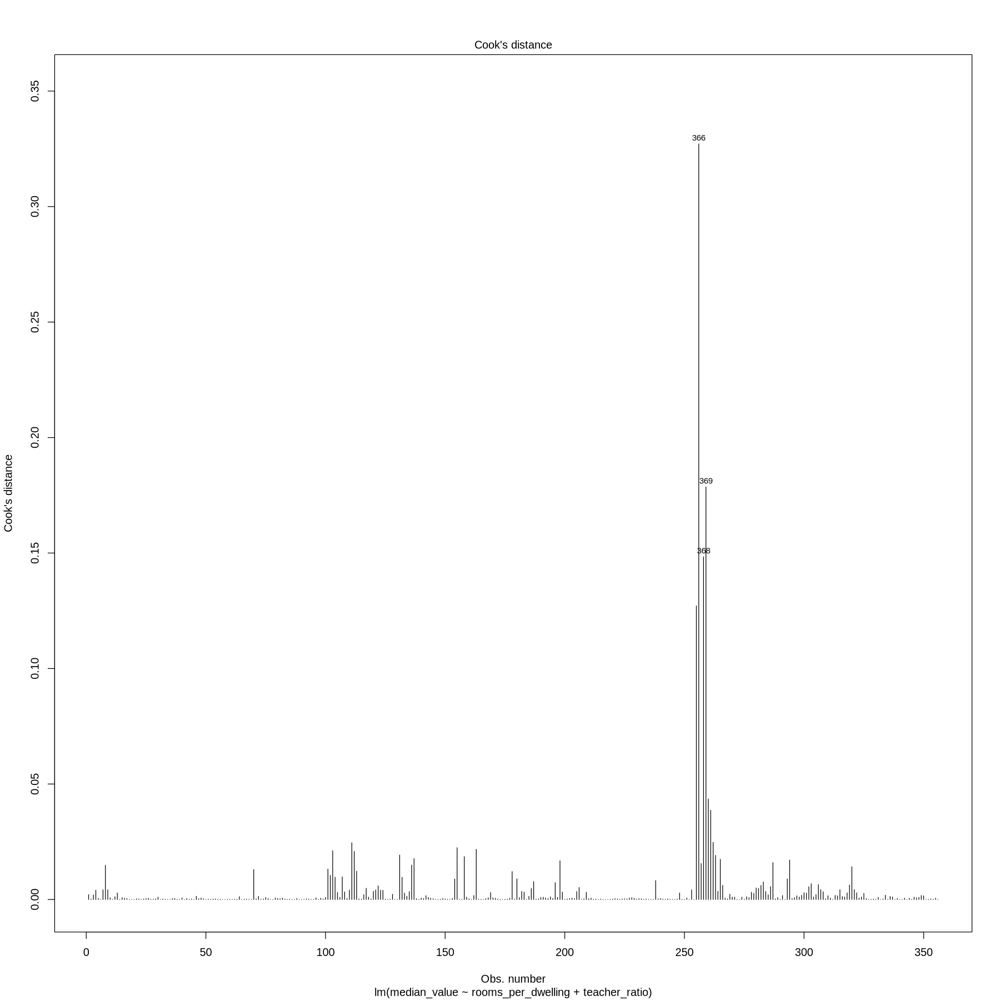

In [229]:
plot(modelo_lm , 4)
model_dm = augment(modelo_lm)

Observamos algunos outliers que pueden estar generando ruído, sin embargo son una minoria. Aún asi, la aparción de outliers hace que el modelo sea menos confiable.

R2,RMSE,MAE
<dbl>,<dbl>,<dbl>
0.5660319,5.949739,4.119689


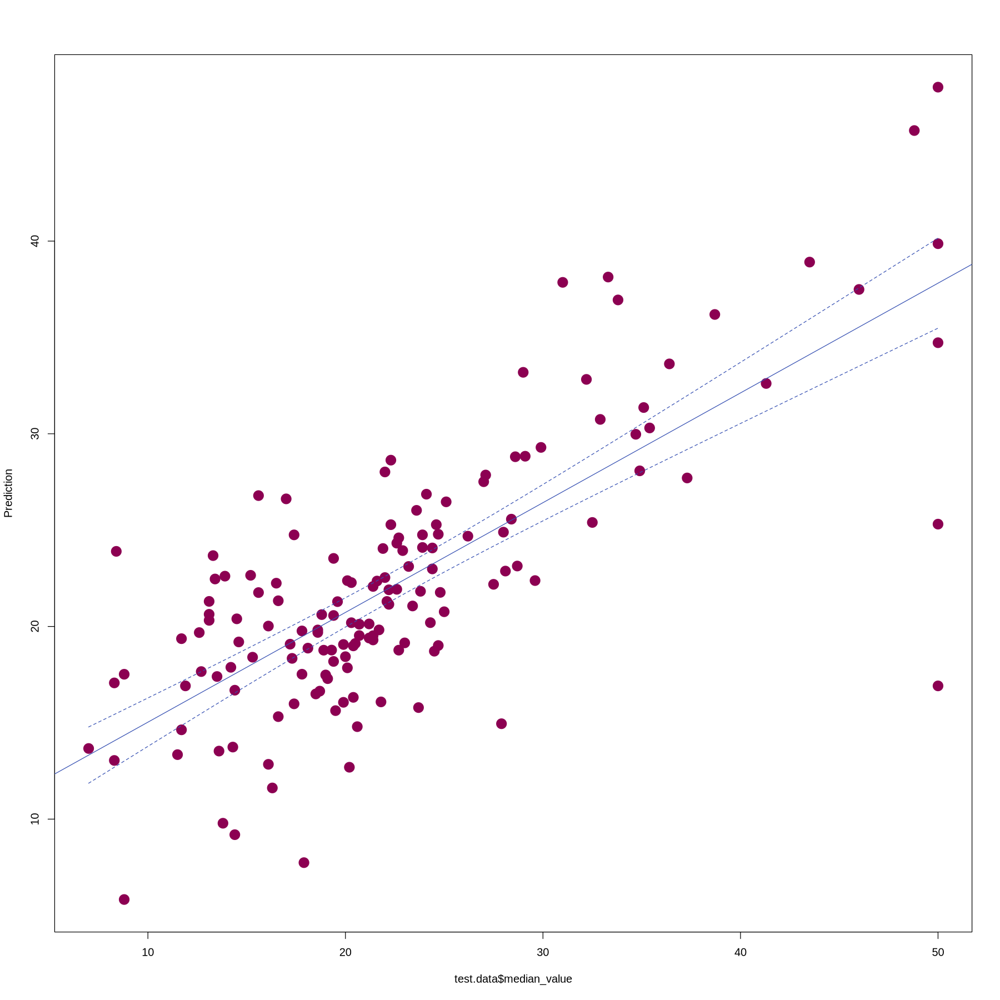

In [235]:
prediction = predict(modelo_lm, data_test)

### Visualization
plot(data_test$median_value, prediction, xlab="test.data$median_value", ylab="Prediction", pch =19,col ="#8c0052", cex=2)

#add fitted regression line
lm.out = lm(prediction ~ median_value, data = data_test)
newx = seq(min(data_test$median_value),max(data_test$median_value),by = 0.05)
conf_interval = predict(lm.out, newdata=data.frame(median_value=newx), interval="confidence", level = 0.95)
abline(lm.out, col = "#3650b2")

#add conf_interval lines
lines(newx, conf_interval[,2], col="#3650b2", lty=2)
lines(newx, conf_interval[,3], col="#3650b2", lty=2)

# Statistical Measure
data.frame( R2 = R2(prediction, data_test$median_value),
            RMSE = RMSE(prediction, data_test$median_value),
            MAE = MAE(prediction, data_test$median_value))

R2: se obtiene un 0.566, esto significa que cerca del 56% de la variabilidad de mi variable respuesta median_value es explicada por el modelo. Al ser un valor alejado a 1 nos indica un mal ajuste del modelo

RMSE - Error Cuadrático Medio: en promedio, las predicciones difieren alrededor d5.9521 unidades de la variable de respuesta

MAE - Error Absoluto Medio: este indicador es la media de las diferencias absolutas entre las predicciones y los valores reales. Inferior al RMSE, la diferencia media entre variable respuesta y predicción es4.122.98

Tras observar los resultados obtenidos por el modelo se puede concluir que el modelo no se ajusta bien a los datos y las predicciones no són lo suficientemente buenas como para usarlas en la vida real, con lo que no usaria este modelo.